In [11]:
import pandas as pd

In [7]:
train = pd.read_csv("./splits/kitti_train.csv", index_col=0)
test = pd.read_csv("./splits/kitti_test.csv", index_col=0)

In [8]:
train.head()

,images,depth
0,2011_10_03/2011_10_03_drive_0042_sync/image_03...,2011_10_03_drive_0042_sync/proj_depth/groundtr...
1,2011_10_03/2011_10_03_drive_0042_sync/image_03...,2011_10_03_drive_0042_sync/proj_depth/groundtr...
2,2011_10_03/2011_10_03_drive_0042_sync/image_03...,2011_10_03_drive_0042_sync/proj_depth/groundtr...
3,2011_10_03/2011_10_03_drive_0042_sync/image_03...,2011_10_03_drive_0042_sync/proj_depth/groundtr...
4,2011_10_03/2011_10_03_drive_0042_sync/image_03...,2011_10_03_drive_0042_sync/proj_depth/groundtr...


In [9]:
test.head()

,images,depth
0,2011_09_26/2011_09_26_drive_0036_sync/image_03...,2011_09_26_drive_0036_sync/proj_depth/groundtr...
1,2011_09_26/2011_09_26_drive_0036_sync/image_03...,2011_09_26_drive_0036_sync/proj_depth/groundtr...
2,2011_09_26/2011_09_26_drive_0036_sync/image_03...,2011_09_26_drive_0036_sync/proj_depth/groundtr...
3,2011_09_26/2011_09_26_drive_0036_sync/image_03...,2011_09_26_drive_0036_sync/proj_depth/groundtr...
4,2011_09_26/2011_09_26_drive_0036_sync/image_03...,2011_09_26_drive_0036_sync/proj_depth/groundtr...


In [85]:
import tensorflow as tf
import numpy as np
import random

def preprocess_color(image, flip=False, shape=None, **kwargs):
    if flip:
        image = tf.image.flip_left_right(image)
        
    if shape:
        h, w, _ = image.shape
        
        max_height = h - shape[0]
        max_width = w - shape[1]
        
        random_height = np.random.randint(0, max_height)
        random_width = np.random.randint(0, max_width)
        
        print(random_height, random_width)
        
        image = image[random_height:random_height+shape[0], random_width:random_width+shape[1]]

    if type(image) is np.ndarray:
        return image
    return image.numpy(), (random_height, random_width)


def load_color_image(filename, **kwargs):
    image = tf.io.read_file(filename)
    image = tf.io.decode_image(image, channels=3, expand_animations=False)
    image = tf.cast(image, tf.float32)
    return image


def load_color(filename, path="/data3/awong/kitti_raw/", flip=False, shape=(256, 640), **kwargs):
    img = load_color_image(path + filename)
    return preprocess_color(img, flip, shape)

In [90]:
# def preprocess_depth(image, flip=False, shape=None, random_loc=None, **kwargs):
#     if flip:
#         image = tf.image.flip_left_right(image)
        
#     if shape:
#         h, w = shape
#         ran_h, ran_w = random_loc
#         image = image[h:h+ran_h, w:w+ran_w]

#     if type(image) is np.ndarray:
#         return image
#     return image.numpy()

def preprocess_depth(image, flip=False, shape=None, rand_shape=(0,0), **kwargs):
    if flip:
        image = tf.image.flip_left_right(image)
        
    if shape:
        random_height, random_width = rand_shape
        print(random_height, random_width)
        image = image[random_height:random_height+shape[0], random_width:random_width+shape[1]]

    if type(image) is np.ndarray:
        return image
    return image.numpy()


def load_depth_image(filename, **kwargs):
    image = tf.io.read_file(filename)
    image = tf.io.decode_image(image, channels=1, expand_animations=False)
    image = tf.cast(image, tf.float32)
    return image


def load_depth(filename, split="train", path="/data3/awong/kitti/", flip=False, shape=(256, 640), rand_shape=(0,0), **kwargs):
    img = load_depth_image(path + f"{split}/" + filename)

    return preprocess_depth(img, flip, shape, rand_shape)

32 263
(256, 640, 3)


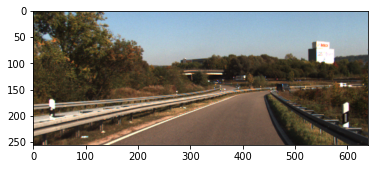

In [91]:
import matplotlib.pyplot as plt

def random_location(image):
    h, w, _ = image.shape

    max_height = h - shape[0]
    max_width = w - shape[1]

    random_height = np.random.randint(0, max_height)
    random_width = np.random.randint(0, max_width)

    print(random_height, random_width)
    
    return random_height, random_width
    
file = train["images"][0]
img, rand_shape = load_color(file)
img = (img - img.min()) / (img.max() - img.min())
print(img.shape)
plt.imshow(img)

32 263
(256, 640, 1)


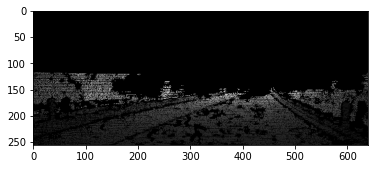

In [92]:
file = train["depth"][0]
img = load_depth(file, rand_shape=rand_shape)
img = (img - img.min()) / (img.max() - img.min())
print(img.shape)
plt.imshow(img, cmap='gray')

In [1]:
import kitti_loader as kloader
import data

train = kloader.generate_dataframe("./splits/kitti_train.csv", "train")
test = kloader.generate_dataframe("./splits/kitti_test.csv", "val")

train_generator = data.DataGenerator(train, datatype="kitti")

2022-05-07 01:28:09.720596: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [2]:
images, depth = train_generator.__getitem__(1)

2022-05-07 01:28:11.990266: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-05-07 01:28:11.991291: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-05-07 01:28:14.453443: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:21:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.75GiB deviceMemoryBandwidth: 836.37GiB/s
2022-05-07 01:28:14.455315: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 1 with properties: 
pciBusID: 0000:22:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.75GiB deviceMemoryBandwidth: 836.37GiB/s
2022-05-07 01:28:14.457145: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 2 with properties: 
pciBusID: 0000:41:00.0 name: Tesl

/tmp/ipykernel_28113/235518556.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(19,10))


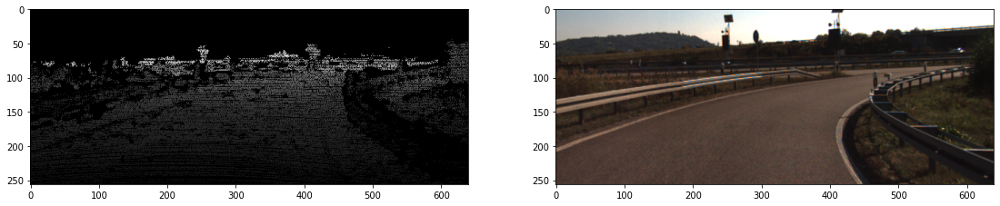

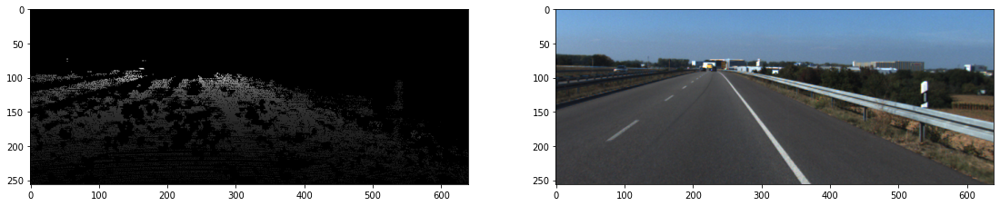

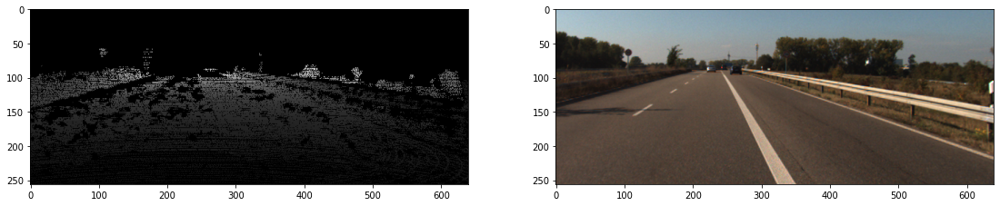

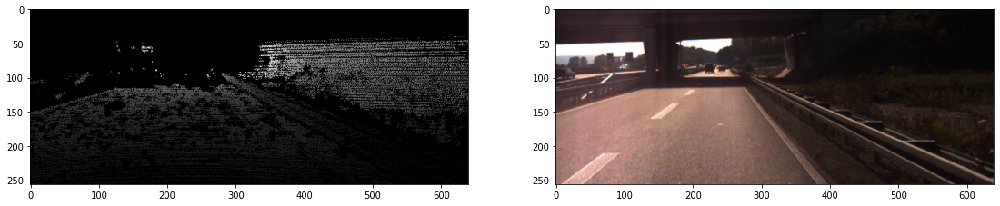

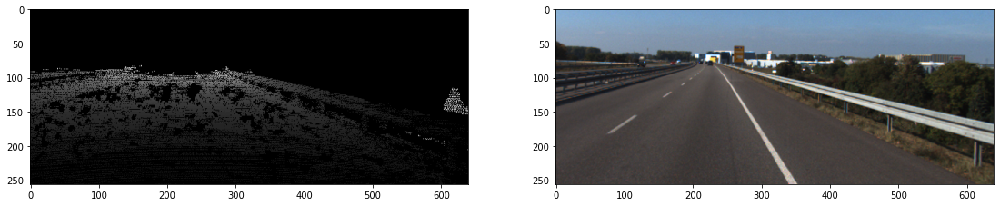

...

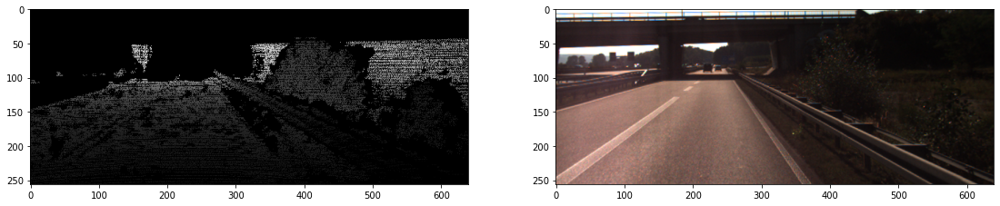

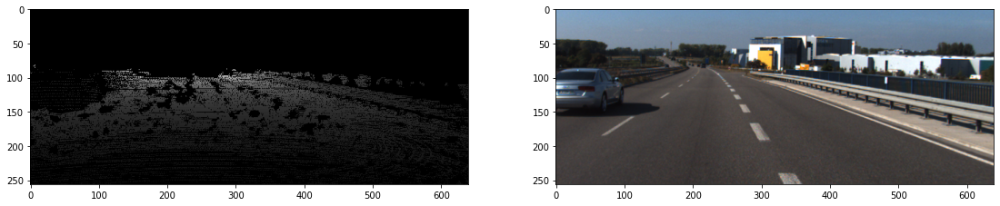

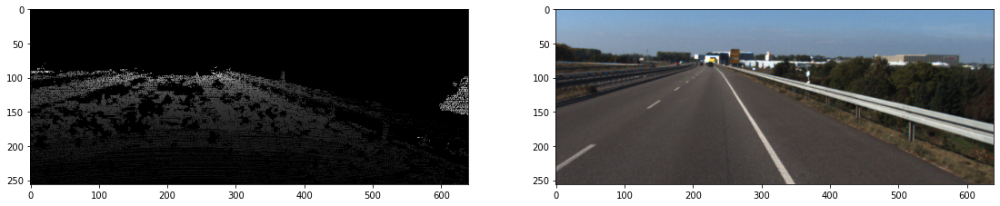

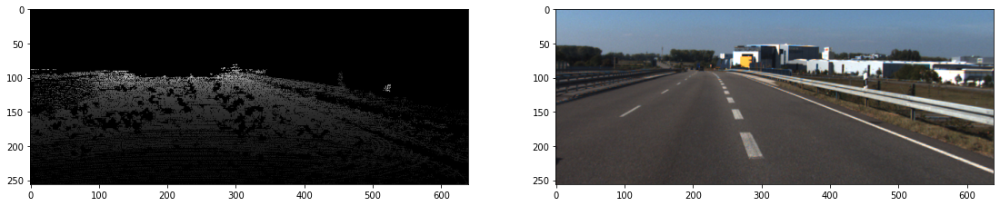

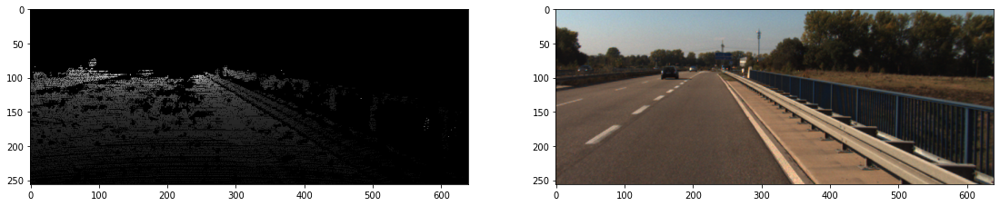

In [5]:
import matplotlib.pyplot as plt

for i in range(32):
    plt.figure(figsize=(19,10))
    plt.subplot(1,2,1)
    plt.imshow(depth[i], cmap='gray')
    plt.subplot(1,2,2)
    plt.imshow(images[i])